In [1]:
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', 500)
import seaborn as sns
import numpy as np
import matplotlib
import os

In [2]:
import importlib
import euler_utils
import plotting_utils
import predictions_evaluations
import utils
import idf_plotting

/cluster/apps/nss/gcc-6.3.0/python/3.8.5/x86_64/lib64/python3.8/site-packages/pyproj/__init__.py:78: UserWarning: Valid PROJ data directory not found. Either set the path using the environmental variable PROJ_LIB or with `pyproj.datadir.set_data_dir`.
  warnings.warn(str(err))


In [3]:
importlib.reload(euler_utils)
importlib.reload(plotting_utils)
importlib.reload(predictions_evaluations)
importlib.reload(utils)
importlib.reload(idf_plotting)

<module 'idf_plotting' from '/cluster/home/mfrancesc/IVT/eqasim-java/switzerland/Analysis_notebooks/idf_plotting.py'>

In [4]:
scratch_folder = '/cluster/scratch/mfrancesc/IVT/SA_scenario/'
work_folder = '/cluster/work/ivt_vpl/mfrancesc/SA_scenario/'
last_iter = 60
methods = ['markov','msa02','mw5']

# Fixed feedback

In [9]:
data_fixed = euler_utils.read_output(
    os.path.join(scratch_folder,"idf","fixed","1000"),
    last_iter=last_iter
)

100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


In [7]:
data_fixed_list = [('fixed 1000 vehicles', data_fixed, last_iter)]

In [8]:
display(plotting_utils.get_multiple_stats_table(data_fixed_list))

fixed 1000 vehicles (it.60)
Number of rides                                                       71166
Wait time (min)                   Mean                              4.05489
                                  Median                                3.7
                                  Std                               2.62628
                                  75-percentile                     5.91667
                                  99-percentile                        9.95
                                  Max                               51.5167
Travel time (min)                 Mean                               11.242
                                  Median                            9.13333
                                  Std                               9.20889
                                  75-percentile                     15.4292
                                  99-percentile                     40.3167
                                  Max                               254.983
Mean direct distance (km)                                           2.16259
Average detour factor (time wise)                                   1.45227
Total execution time                                        0 days 17:41:29

# Markov with different fleet sizes

In [5]:
data_markov_rebalancing = {}

In [6]:
data_markov_no_rebalancing = {}

In [7]:
fleet_sizes = list(range(200, 2001,200))

In [8]:
for f in fleet_sizes:
    data_markov_rebalancing[f] = euler_utils.read_output(
        os.path.join(work_folder,"idf","markov_fleetSize/", str(f)),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:44<00:00,  1.36it/s]


In [9]:
for f in fleet_sizes:
    data_markov_no_rebalancing[f] = euler_utils.read_output(
        os.path.join(work_folder,"idf","markov_fleetSize_no_rebalancing/", str(f)),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:43<00:00,  1.40it/s]


In [10]:
data_list_markov_rebalancing = [(str(k) + ' vehicles', v, last_iter) for k,v in data_markov_rebalancing.items()]

In [11]:
data_list_markov_no_rebalancing = [(str(k) + ' vehicles', v, last_iter) for k,v in data_markov_no_rebalancing.items()]

In [12]:
display(plotting_utils.get_multiple_stats_table(data_list_markov_rebalancing))

200 vehicles (it.60)  \
Number of rides                                                17957   
Wait time (min)                   Mean                       5.81153   
                                  Median                        5.95   
                                  Std                        2.81119   
                                  75-percentile              8.28333   
                                  99-percentile                10.25   
                                  Max                        24.5667   
Travel time (min)                 Mean                        12.852   
                                  Median                     10.9667   
                                  Std                          9.872   
                                  75-percentile                17.55   
                                  99-percentile              42.7147   
                                  Max                        141.583   
Mean direct distance (km)                                     2.9414   
Average detour factor (time wise)                            1.34751   
Total execution time                                 0 days 14:21:48   

                                                400 vehicles (it.60)  \
Number of rides                                                34988   
Wait time (min)                   Mean                       5.54452   
                                  Median                     5.68333   
                                  Std                        2.82158   
                                  75-percentile              7.88333   
                                  99-percentile              10.2167   
                                  Max                        25.8167   
Travel time (min)                 Mean                       12.3452   
                                  Median                     10.4667   
                                  Std                        9.44178   
                                  75-percentile              16.8333   
                                  99-percentile              41.1167   
                                  Max                        160.017   
Mean direct distance (km)                                    2.70995   
Average detour factor (time wise)                            1.36474   
Total execution time                                 0 days 18:46:41   

                                                600 vehicles (it.60)  \
Number of rides                                                52715   
Wait time (min)                   Mean                       5.25352   
                                  Median                     5.31667   
                                  Std                        2.77001   
                                  75-percentile                 7.45   
                                  99-percentile                10.15   
                                  Max                        71.7833   
Travel time (min)                 Mean                       11.7875   
                                  Median                     9.83333   
                                  Std                        9.22674   
                                  75-percentile              16.0833   
                                  99-percentile                 39.9   
                                  Max                        167.367   
Mean direct distance (km)                                    2.49348   
Average detour factor (time wise)                            1.37831   
Total execution time                                 0 days 21:51:00   

                                                800 vehicles (it.60)  \
Number of rides                                                69931   
Wait time (min)                   Mean                       4.76458   
                                  Median                     4.71667   
                                  Std                        2.66729   
             

In [13]:
display(plotting_utils.get_multiple_stats_table(data_list_markov_no_rebalancing))

200 vehicles (it.60)  \
Number of rides                                                17747   
Wait time (min)                   Mean                       5.91238   
                                  Median                     6.13333   
                                  Std                        2.75931   
                                  75-percentile                  8.3   
                                  99-percentile                 10.2   
                                  Max                        24.5333   
Travel time (min)                 Mean                       12.9113   
                                  Median                     10.9833   
                                  Std                        9.85757   
                                  75-percentile              17.5667   
                                  99-percentile              42.7603   
                                  Max                          136.9   
Mean direct distance (km)                                    2.95335   
Average detour factor (time wise)                            1.34154   
Total execution time                                 0 days 19:17:22   

                                                400 vehicles (it.60)  \
Number of rides                                                34365   
Wait time (min)                   Mean                       5.66989   
                                  Median                     5.81667   
                                  Std                        2.78237   
                                  75-percentile                    8   
                                  99-percentile                 10.2   
                                  Max                        29.7833   
Travel time (min)                 Mean                       12.2961   
                                  Median                     10.3667   
                                  Std                        9.47536   
                                  75-percentile              16.7833   
                                  99-percentile              41.0227   
                                  Max                        158.917   
Mean direct distance (km)                                    2.71916   
Average detour factor (time wise)                            1.34882   
Total execution time                                 1 days 00:07:09   

                                                600 vehicles (it.60)  \
Number of rides                                                50260   
Wait time (min)                   Mean                       5.34261   
                                  Median                     5.41667   
                                  Std                        2.73131   
                                  75-percentile              7.53333   
                                  99-percentile                10.15   
                                  Max                        31.8333   
Travel time (min)                 Mean                       11.8476   
                                  Median                        9.95   
                                  Std                        9.05909   
                                  75-percentile                16.25   
                                  99-percentile              39.7735   
                                  Max                        148.867   
Mean direct distance (km)                                    2.52193   
Average detour factor (time wise)                            1.37995   
Total execution time                                 1 days 03:04:17   

                                                800 vehicles (it.60)  \
Number of rides                                                64221   
Wait time (min)                   Mean                       4.98843   
                                  Median                     5.03333   
                                  Std                        2.68917   
             

In [14]:
start_time = 6
end_time = 24
bin_duration_min = 30
min_distance = 0
max_distance = 10000
bin_distance_m = 1000

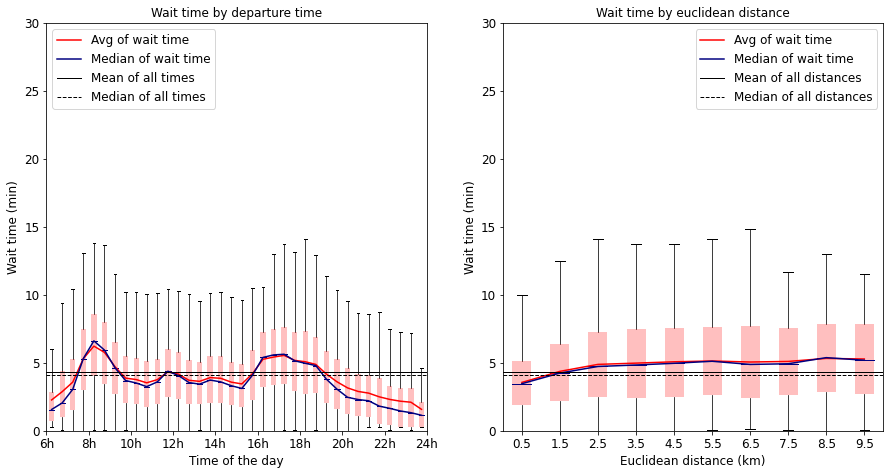

In [15]:
plotting_utils.plot_waiting_time(data_markov_rebalancing[1000], start_time, end_time, bin_duration_min,
                 min_distance, max_distance, bin_distance_m, iteration=-1, 
               filter_router_zeros=False, add_boxplots=True, ylim=30)

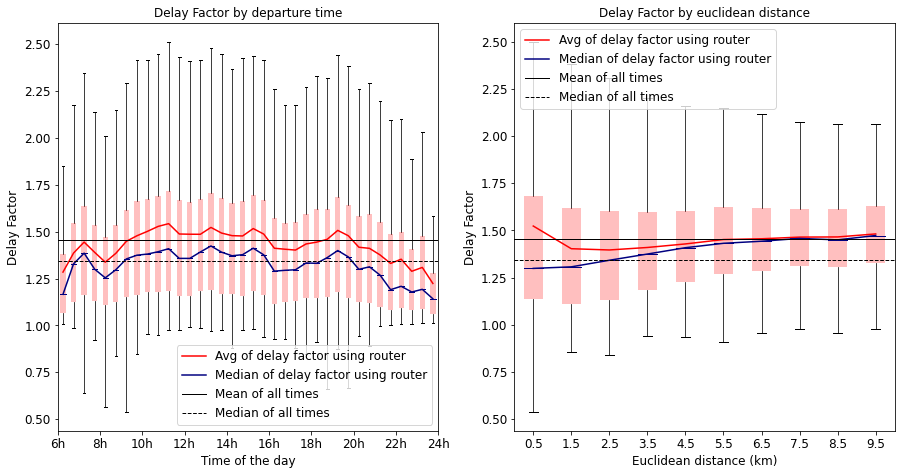

In [16]:
plotting_utils.plot_delay_factor(data_markov_rebalancing[1000], start_time, end_time, bin_duration_min,
                 min_distance, max_distance, bin_distance_m, iteration=-1, 
                plot_estimated=False, plot_using_sum=False, filter_router_zeros=False,
                                add_boxplots=True)

Imputing 1131  zones onto 83211  points by spatial join...


100%|██████████| 8/8 [00:00<00:00,  8.64it/s]


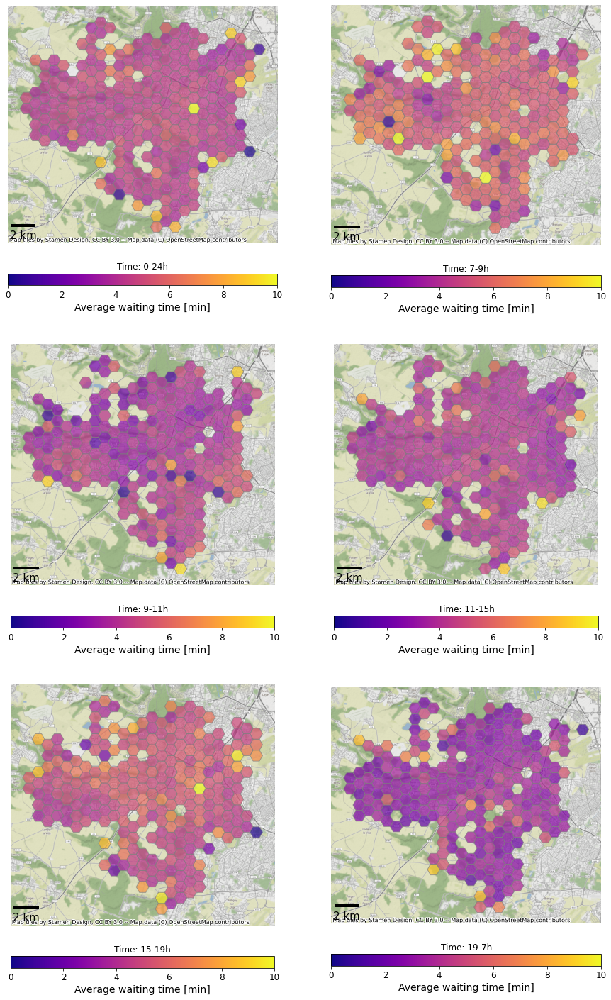

In [17]:
it_drt_trips_stats = data_markov_rebalancing[1000]['drt_trips_stats'][last_iter].copy(deep=True)
zones = data_markov_rebalancing[1000]['fixedZones'].copy(deep=True)
zones.crs = 'EPSG:2154'
zones_id = 'zoneId'
idf_plotting.plot_average_waitTime_per_timeBins(it_drt_trips_stats, zones, zones_id, vmin=0, vmax=10)

Create a plot with one peak time and low demand time to compare (maybe 7-9 and 19-7)

100%|██████████| 1/1 [00:00<00:00,  7.33it/s]

Imputing 1131  zones onto 17957  points by spatial join...



  0%|          | 0/3 [00:00<?, ?it/s]

Imputing 1131  zones onto 34988  points by spatial join...


  0%|          | 0/5 [00:00<?, ?it/s]

Imputing 1131  zones onto 52715  points by spatial join...


  0%|          | 0/6 [00:00<?, ?it/s]

Imputing 1131  zones onto 69931  points by spatial join...


100%|██████████| 6/6 [00:00<00:00,  8.85it/s]


Imputing 1131  zones onto 83211  points by spatial join...


100%|██████████| 8/8 [00:00<00:00,  8.72it/s]


Imputing 1131  zones onto 92360  points by spatial join...


100%|██████████| 9/9 [00:01<00:00,  8.91it/s]


Imputing 1131  zones onto 99673  points by spatial join...


100%|██████████| 9/9 [00:01<00:00,  8.84it/s]


Imputing 1131  zones onto 105564  points by spatial join...


100%|██████████| 10/10 [00:01<00:00,  8.89it/s]


Imputing 1131  zones onto 109146  points by spatial join...


100%|██████████| 10/10 [00:01<00:00,  9.01it/s]


Imputing 1131  zones onto 111025  points by spatial join...


100%|██████████| 11/11 [00:01<00:00,  8.82it/s]


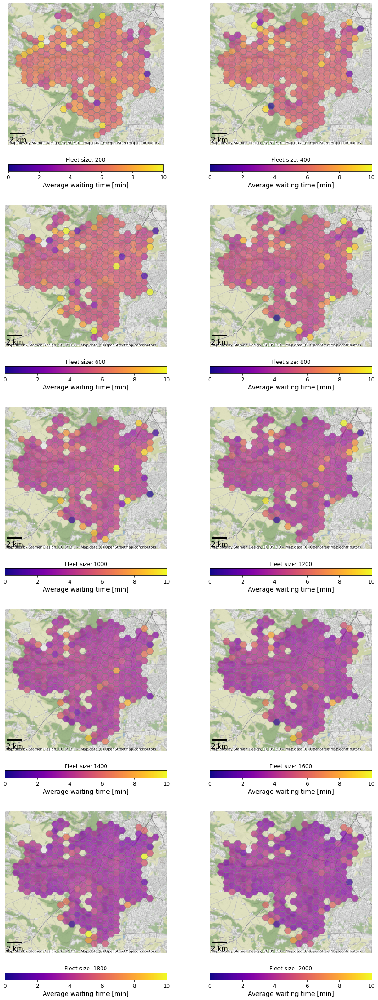

In [18]:
idf_plotting.plot_average_waitTime_per_fleeSize(data_markov_rebalancing, vmin=0, vmax=10)

100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

Imputing 1131  zones onto 17747  points by spatial join...



 33%|███▎      | 1/3 [00:00<00:00,  9.12it/s]

Imputing 1131  zones onto 34365  points by spatial join...


  0%|          | 0/5 [00:00<?, ?it/s]

Imputing 1131  zones onto 50260  points by spatial join...


  0%|          | 0/6 [00:00<?, ?it/s]

Imputing 1131  zones onto 64221  points by spatial join...


  0%|          | 0/7 [00:00<?, ?it/s]

Imputing 1131  zones onto 75177  points by spatial join...


100%|██████████| 7/7 [00:00<00:00,  8.89it/s]


Imputing 1131  zones onto 84123  points by spatial join...


100%|██████████| 8/8 [00:00<00:00,  8.91it/s]


Imputing 1131  zones onto 90344  points by spatial join...


100%|██████████| 9/9 [00:01<00:00,  8.61it/s]


Imputing 1131  zones onto 96132  points by spatial join...


100%|██████████| 9/9 [00:01<00:00,  8.97it/s]


Imputing 1131  zones onto 100397  points by spatial join...


100%|██████████| 10/10 [00:01<00:00,  9.12it/s]


Imputing 1131  zones onto 103203  points by spatial join...


100%|██████████| 10/10 [00:01<00:00,  9.07it/s]


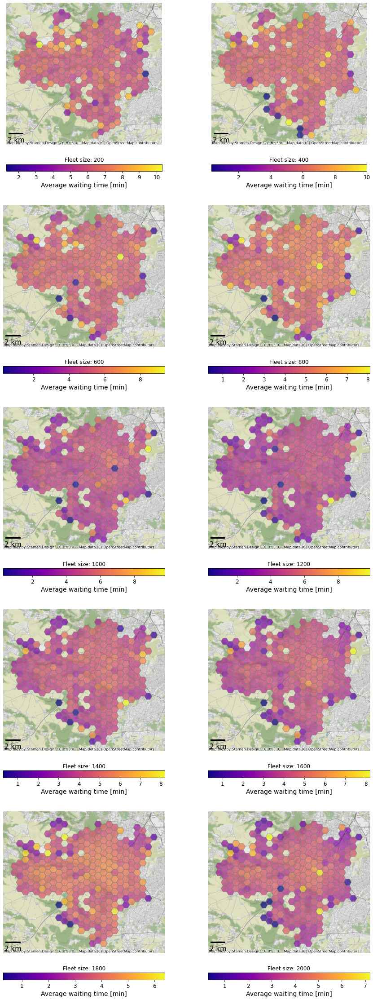

In [19]:
idf_plotting.plot_average_waitTime_per_fleeSize(data_markov_no_rebalancing)#, vmin=0, vmax=10)

## Check with dynamic method

In [20]:
data_dynamic_CN_markov = {}

In [21]:
data_dynamic_CN_msa02 = {}
data_dynamic_CN_mw5 = {}

In [22]:
k_values = [10,25,50,100]
for k in k_values:
    data_dynamic_CN_markov[k] = euler_utils.read_output(
        os.path.join(work_folder,"idf","dynamic_CN","markov", "k"+str(k)),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:39<00:00,  1.54it/s]


In [23]:
for k in k_values:
    data_dynamic_CN_mw5[k] = euler_utils.read_output(
        os.path.join(work_folder,"idf","dynamic_CN","mw5", "k"+str(k)),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:42<00:00,  1.45it/s]


In [24]:
for k in k_values:
    data_dynamic_CN_msa02[k] = euler_utils.read_output(
        os.path.join(work_folder,"idf","dynamic_CN","msa02", "k"+str(k)),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:42<00:00,  1.42it/s]


In [25]:
data_square_850_markov = euler_utils.read_output(
        os.path.join(work_folder,"idf","square_850","markov"),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:43<00:00,  1.41it/s]


In [26]:
data_square_850_mw5 = euler_utils.read_output(
        os.path.join(work_folder,"idf","square_850","mw5"),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:42<00:00,  1.43it/s]


In [27]:
data_square_850_msa02 = euler_utils.read_output(
        os.path.join(work_folder,"idf","square_850","msa02"),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:40<00:00,  1.50it/s]


In [28]:
data_1000_fleet = {}
for method in ['markov', 'mw5', 'msa02']:
    data_1000_fleet[method] = euler_utils.read_output(
        os.path.join(work_folder,"idf","fleetSize_1000",method),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:42<00:00,  1.45it/s]


In [29]:
data_list_methods_comparison_markov = (
    [('CN k=' + str(k), v, last_iter) for k,v in data_dynamic_CN_markov.items()] +
    [('Hex 500m', data_1000_fleet['markov'], last_iter)] +
    [('Square 850m', data_square_850_markov, last_iter)]
)

In [30]:
display(plotting_utils.get_multiple_stats_table(data_list_methods_comparison_markov))

CN k=10 (it.60)  \
Number of rides                                            83339   
Wait time (min)                   Mean                   4.31651   
                                  Median                 4.08333   
                                  Std                    2.62671   
                                  75-percentile          6.18333   
                                  99-percentile          9.98333   
                                  Max                    62.8333   
Travel time (min)                 Mean                   11.1222   
                                  Median                    9.05   
                                  Std                    8.87348   
                                  75-percentile          15.3667   
                                  99-percentile          38.6667   
                                  Max                      289.9   
Mean direct distance (km)                                2.17377   
Average detour factor (time wise)                        1.45757   
Total execution time                             0 days 22:37:33   

                                                 CN k=25 (it.60)  \
Number of rides                                            83230   
Wait time (min)                   Mean                   4.30154   
                                  Median                 4.06667   
                                  Std                    2.63375   
                                  75-percentile          6.16667   
                                  99-percentile          9.98333   
                                  Max                    62.1333   
Travel time (min)                 Mean                   11.1847   
                                  Median                 9.08333   
                                  Std                    9.03145   
                                  75-percentile             15.4   
                                  99-percentile          39.4285   
                                  Max                    287.583   
Mean direct distance (km)                                2.17445   
Average detour factor (time wise)                        1.46233   
Total execution time                             0 days 21:09:34   

                                                 CN k=50 (it.60)  \
Number of rides                                            83032   
Wait time (min)                   Mean                   4.32975   
                                  Median                     4.1   
                                  Std                    2.65787   
                                  75-percentile              6.2   
                                  99-percentile          9.98333   
                                  Max                    53.7667   
Travel time (min)                 Mean                   11.1492   
                                  Median                    9.05   
                                  Std                    9.01587   
                                  75-percentile          15.3667   
                                  99-percentile          39.0845   
                                  Max                      209.1   
Mean direct distance (km)                                2.18016   
Average detour factor (time wise)                        1.45336   
Total execution time                             0 days 22:11:28   

                                                CN k=100 (it.60)  \
Number of rides                                            83185   
Wait time (min)                   Mean                   4.32402   
                                  Median                     4.1   
                                  Std                    2.67191   
                                  75-percentile              6.2   
                                  99-percentile               10   
                                  Max                    61.8833   
Travel time (min)                 

,count,mean,std,min,25%,50%,75%,95%,99%,max,MSE,RMSE,MAE,% errors < 0
title,,,,,,,,,,,,,,
CN k=10 on iteration 60,4340.0,0.026735,2.485343,-7.853333,-1.800000,-0.083333,1.761667,4.268583,5.859517,12.225000,6.176223,2.485201,2.020435,51.129032
CN k=25 on iteration 60,4329.0,-0.030495,2.378807,-7.144667,-1.820667,-0.071333,1.667333,4.002400,5.293707,7.788000,5.658344,2.378727,1.951908,51.074151
CN k=50 on iteration 60,4367.0,0.088653,2.597517,-6.538667,-1.746167,-0.100667,1.824500,4.088967,5.613667,48.810333,6.753411,2.598733,2.018617,51.133501
CN k=100 on iteration 60,4357.0,0.034931,2.425911,-6.008500,-1.798333,-0.128000,1.782333,4.110433,5.597827,14.161000,5.884914,2.425884,1.993432,51.732844
Hex 500m on iteration 60,4310.0,-0.019652,2.525835,-9.116667,-1.848915,-0.123652,1.746167,4.063093,5.779590,22.017754,6.378748,2.525618,2.028429,51.531323
Square 850m on iteration 60,4367.0,-0.005032,2.478552,-7.191667,-1.868515,-0.077083,1.802913,4.111998,5.677789,11.342929,6.141841,2.478274,2.035569,50.996107


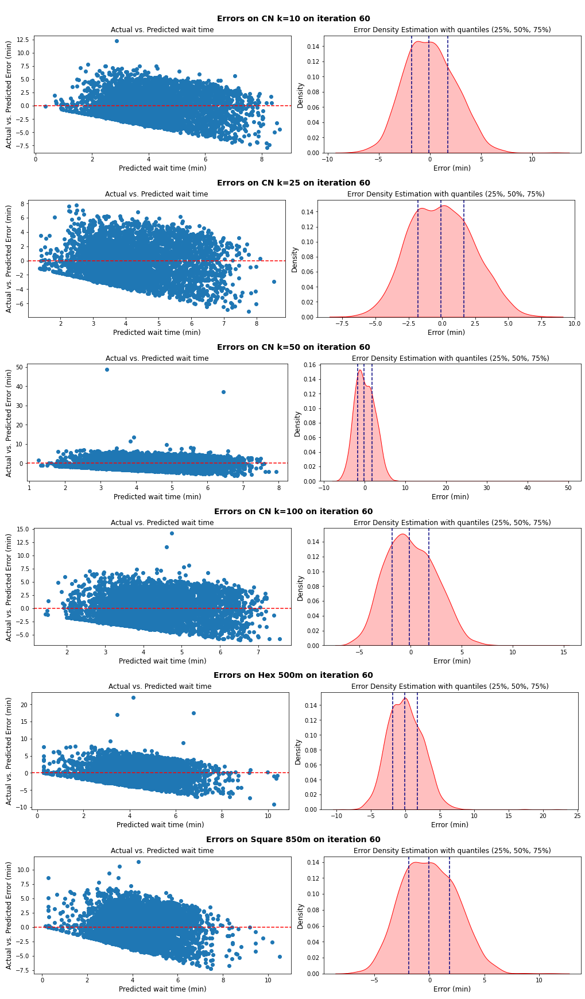

In [46]:
waitTime_pred_stats = predictions_evaluations.plot_multiple_actual_vs_fitted(data_list_methods_comparison_markov, 'waitTime')

plot -10 10

check computational time

In [32]:
data_list_methods_comparison_mw5 = (
    [('CN k=' + str(k), v, last_iter) for k,v in data_dynamic_CN_mw5.items()] +
    [('Hex 500m', data_1000_fleet['mw5'], last_iter)] +
    [('Square 850m', data_square_850_mw5, last_iter)]
)
display(plotting_utils.get_multiple_stats_table(data_list_methods_comparison_mw5))

CN k=10 (it.60)  \
Number of rides                                            83407   
Wait time (min)                   Mean                   4.31303   
                                  Median                 4.08333   
                                  Std                    2.76892   
                                  75-percentile          6.16667   
                                  99-percentile               10   
                                  Max                      251.5   
Travel time (min)                 Mean                   11.1095   
                                  Median                 9.06667   
                                  Std                     8.8441   
                                  75-percentile          15.3667   
                                  99-percentile            38.65   
                                  Max                    282.533   
Mean direct distance (km)                                2.17702   
Average detour factor (time wise)                        1.45525   
Total execution time                             0 days 19:53:13   

                                                 CN k=25 (it.60)  \
Number of rides                                            83326   
Wait time (min)                   Mean                   4.33198   
                                  Median                     4.1   
                                  Std                    2.66664   
                                  75-percentile          6.18333   
                                  99-percentile          10.0167   
                                  Max                      62.25   
Travel time (min)                 Mean                   11.2074   
                                  Median                 9.06667   
                                  Std                    9.19118   
                                  75-percentile          15.3667   
                                  99-percentile          40.1958   
                                  Max                     280.05   
Mean direct distance (km)                                2.17197   
Average detour factor (time wise)                        1.46142   
Total execution time                             0 days 23:24:41   

                                                 CN k=50 (it.60)  \
Number of rides                                            83242   
Wait time (min)                   Mean                   4.31388   
                                  Median                 4.08333   
                                  Std                    2.63875   
                                  75-percentile          6.18333   
                                  99-percentile               10   
                                  Max                    50.1167   
Travel time (min)                 Mean                   11.1477   
                                  Median                 9.03333   
                                  Std                    8.91742   
                                  75-percentile          15.3833   
                                  99-percentile             39.2   
                                  Max                      209.1   
Mean direct distance (km)                                2.18047   
Average detour factor (time wise)                        1.45617   
Total execution time                             0 days 20:14:24   

                                                CN k=100 (it.60)  \
Number of rides                                            83324   
Wait time (min)                   Mean                   4.30591   
                                  Median                 4.08333   
                                  Std                    2.62586   
                                  75-percentile          6.18333   
                                  99-percentile          9.98333   
                                  Max                    66.6667   
Travel time (min)                 

,count,mean,std,min,25%,50%,75%,95%,99%,max,MSE,RMSE,MAE,% errors < 0
title,,,,,,,,,,,,,,
CN k=10 on iteration 60,4373.0,0.025629,2.421439,-6.696333,-1.778335,-0.131510,1.757636,4.160770,5.691403,7.144333,5.862683,2.421298,1.993025,51.749371
CN k=25 on iteration 60,4368.0,0.014330,2.399856,-6.940190,-1.745718,-0.093711,1.697915,4.061192,5.492512,13.256115,5.758195,2.399624,1.955032,51.671245
CN k=50 on iteration 60,4341.0,0.010212,2.417135,-6.847708,-1.793391,-0.124917,1.698974,3.997565,5.624057,15.938844,5.841301,2.416878,1.971123,51.762267
CN k=100 on iteration 60,4359.0,-0.026394,2.382317,-7.075917,-1.818453,-0.125061,1.667015,4.018499,5.369531,11.885329,5.674831,2.382190,1.955070,51.754990
Hex 500m on iteration 60,4328.0,-0.017991,2.390930,-7.601296,-1.802888,-0.089055,1.678059,3.960855,5.511400,11.461326,5.715550,2.390722,1.960494,51.293900
Square 850m on iteration 60,4346.0,-0.039630,2.399107,-6.830556,-1.823991,-0.195749,1.687562,3.931659,5.491759,14.551219,5.755960,2.399158,1.960987,52.761160


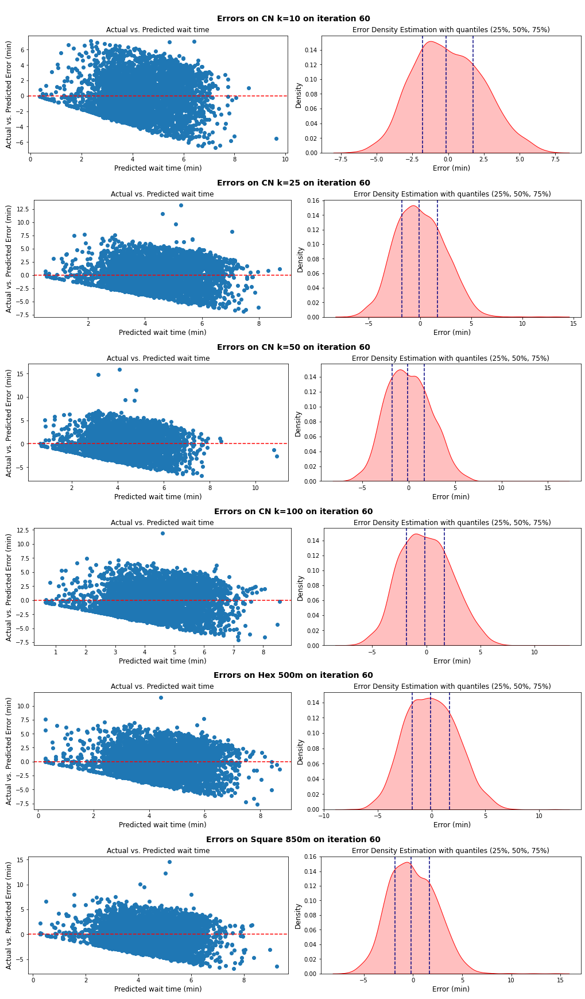

In [33]:
waitTime_pred_stats = predictions_evaluations.plot_multiple_actual_vs_fitted(data_list_methods_comparison_mw5, 'waitTime')

In [34]:
data_list_methods_comparison_msa02 = (
    [('CN k=' + str(k), v, last_iter) for k,v in data_dynamic_CN_msa02.items()] +
    [('Hex 500m', data_1000_fleet['msa02'], last_iter)] +
    [('Square 850m', data_square_850_msa02, last_iter)]
)
display(plotting_utils.get_multiple_stats_table(data_list_methods_comparison_msa02))

CN k=10 (it.60)  \
Number of rides                                            83377   
Wait time (min)                   Mean                   4.29837   
                                  Median                 4.06667   
                                  Std                    2.62837   
                                  75-percentile             6.15   
                                  99-percentile          9.96667   
                                  Max                    74.8167   
Travel time (min)                 Mean                   11.1077   
                                  Median                 9.01667   
                                  Std                    8.82569   
                                  75-percentile            15.35   
                                  99-percentile           38.604   
                                  Max                    270.683   
Mean direct distance (km)                                2.17191   
Average detour factor (time wise)                        1.45697   
Total execution time                             1 days 03:21:08   

                                                 CN k=25 (it.60)  \
Number of rides                                            83155   
Wait time (min)                   Mean                   4.32689   
                                  Median                     4.1   
                                  Std                    2.61163   
                                  75-percentile              6.2   
                                  99-percentile               10   
                                  Max                       21.4   
Travel time (min)                 Mean                   11.1313   
                                  Median                 9.06667   
                                  Std                    8.85542   
                                  75-percentile          15.3833   
                                  99-percentile          38.6833   
                                  Max                    239.033   
Mean direct distance (km)                                2.17307   
Average detour factor (time wise)                        1.45596   
Total execution time                             1 days 04:20:26   

                                                 CN k=50 (it.60)  \
Number of rides                                            83251   
Wait time (min)                   Mean                   4.31552   
                                  Median                     4.1   
                                  Std                     2.6166   
                                  75-percentile          6.18333   
                                  99-percentile          9.98333   
                                  Max                    45.9833   
Travel time (min)                 Mean                   11.0829   
                                  Median                 9.01667   
                                  Std                    8.86735   
                                  75-percentile          15.3167   
                                  99-percentile            38.55   
                                  Max                     242.15   
Mean direct distance (km)                                2.17416   
Average detour factor (time wise)                        1.45096   
Total execution time                             1 days 00:16:56   

                                                CN k=100 (it.60)  \
Number of rides                                            83279   
Wait time (min)                   Mean                   4.31244   
                                  Median                 4.08333   
                                  Std                    2.63693   
                                  75-percentile          6.18333   
                                  99-percentile             9.95   
                                  Max                       75.5   
Travel time (min)                 

,count,mean,std,min,25%,50%,75%,95%,99%,max,MSE,RMSE,MAE,% errors < 0
title,,,,,,,,,,,,,,
CN k=10 on iteration 60,4310.0,-0.048007,2.361747,-6.020798,-1.818143,-0.152823,1.622977,3.994185,5.390697,8.037343,5.578858,2.361961,1.939992,52.064965
CN k=25 on iteration 60,4323.0,0.010990,2.374466,-6.427439,-1.803552,-0.174143,1.739191,4.044361,5.490991,7.915999,5.636905,2.374217,1.954162,52.371039
CN k=50 on iteration 60,4317.0,0.093034,2.382135,-6.325620,-1.750689,-0.023827,1.821232,3.983673,5.597357,15.856409,5.681909,2.383675,1.960301,50.359046
CN k=100 on iteration 60,4323.0,0.001435,2.381391,-6.586707,-1.777772,-0.131263,1.751645,3.951367,5.454645,10.156907,5.669712,2.381116,1.961588,51.815869
Hex 500m on iteration 60,4392.0,0.072725,2.380030,-6.478331,-1.693397,-0.033931,1.782747,4.023781,5.648049,11.109785,5.668543,2.380870,1.946069,50.614754
Square 850m on iteration 60,4355.0,0.099908,2.431072,-7.229961,-1.745865,0.000000,1.874787,4.091046,5.726000,18.242506,5.918735,2.432845,1.984942,49.988519


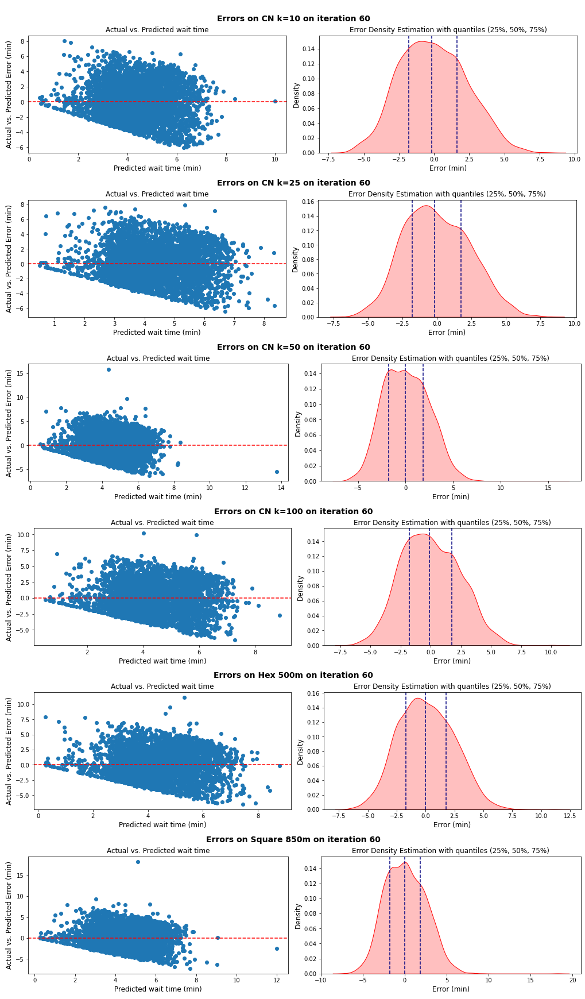

In [35]:
waitTime_pred_stats = predictions_evaluations.plot_multiple_actual_vs_fitted(data_list_methods_comparison_msa02, 'waitTime')

In [37]:
data_200 = {}
for method in methods:
    data_200[method] = euler_utils.read_output(
        os.path.join(work_folder,"idf","fleetSize_200",method),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:29<00:00,  2.08it/s]


In [38]:
data_500 = {}
for method in methods:
    data_500[method] = euler_utils.read_output(
        os.path.join(work_folder,"idf","fleetSize_500",method),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:36<00:00,  1.67it/s]


In [39]:
data_1000 = {}
for method in methods:
    data_1000[method] = euler_utils.read_output(
        os.path.join(work_folder,"idf","fleetSize_1000",method),
        last_iter=last_iter
    )

100%|██████████| 61/61 [00:38<00:00,  1.60it/s]


In [40]:
data_list = [
    ('200 veh Markov', data_200['markov'], last_iter),
    ('200 veh MSA=0.2', data_200['msa02'], last_iter),
    ('200 veh MW=5', data_200['mw5'], last_iter),
    ('500 veh Markov', data_500['markov'], last_iter),
    ('500 veh MSA=0.2', data_500['msa02'], last_iter),
    ('500 veh MW=5', data_500['mw5'], last_iter),
    ('1000 veh Markov', data_1000['markov'], last_iter),
    ('1000 veh MSA=0.2', data_1000['msa02'], last_iter),
    ('1000 veh MW=5', data_1000['mw5'], last_iter),
]

In [41]:
display(plotting_utils.get_multiple_stats_table(data_list))

200 veh Markov (it.60)  \
Number of rides                                                  17891   
Wait time (min)                   Mean                         5.78848   
                                  Median                       5.91667   
                                  Std                          2.80758   
                                  75-percentile                    8.2   
                                  99-percentile                10.2667   
                                  Max                          21.5833   
Travel time (min)                 Mean                         12.9215   
                                  Median                       10.9667   
                                  Std                          9.97693   
                                  75-percentile                17.6167   
                                  99-percentile                   42.4   
                                  Max                           139.15   
Mean direct distance (km)                                      2.95702   
Average detour factor (time wise)                              1.34557   
Total execution time                                   0 days 13:53:51   

                                                200 veh MSA=0.2 (it.60)  \
Number of rides                                                   18229   
Wait time (min)                   Mean                          5.79129   
                                  Median                           5.95   
                                  Std                           2.79555   
                                  75-percentile                 8.21667   
                                  99-percentile                   10.25   
                                  Max                           16.2333   
Travel time (min)                 Mean                          12.6493   
                                  Median                           10.9   
                                  Std                           9.41386   
                                  75-percentile                   17.25   
                                  99-percentile                 40.5527   
                                  Max                           171.683   
Mean direct distance (km)                                       2.89978   
Average detour factor (time wise)                               1.34289   
Total execution time                                    0 days 14:37:48   

                                                200 veh MW=5 (it.60)  \
Number of rides                                                17893   
Wait time (min)                   Mean                       5.82502   
                                  Median                        5.95   
                                  Std                        4.46798   
                                  75-percentile              8.23333   
                                  99-percentile                 10.2   
                                  Max                         473.15   
Travel time (min)                 Mean                       12.8846   
                                  Median                     11.0167   
                                  Std                        10.0476   
                                  75-percentile                17.65   
                                  99-percentile                40.75   
                                  Max                         478.65   
Mean direct distance (km)                                    2.95535   
Average detour factor (time wise)                            1.34236   
Total execution time                                 0 days 14:39:12   

                                                500 veh Markov (it.60)  \
Number of rides                                                  43665   
Wait time (min)                   Mean                         5.43026   
                                  Median                          

,count,mean,std,min,25%,50%,75%,95%,99%,max,MSE,RMSE,MAE,% errors < 0
title,,,,,,,,,,,,,,
200 veh Markov on iteration 60,918.0,0.051387,3.020774,-8.429167,-2.034885,0.261458,2.312405,4.242417,6.681667,15.019444,9.117776,3.019566,2.459510,45.860566
200 veh MSA=0.2 on iteration 60,968.0,0.024649,2.742653,-10.820958,-1.800647,0.309587,2.143939,3.859771,5.221528,8.465531,7.514983,2.741347,2.266800,45.144628
200 veh MW=5 on iteration 60,942.0,0.032749,2.695241,-8.933333,-1.764411,0.228763,2.023694,3.963104,5.514589,9.532667,7.257685,2.694009,2.186691,47.027601
500 veh Markov on iteration 60,2219.0,0.049069,2.692740,-8.116667,-1.797222,0.183333,2.076429,4.159111,5.456559,8.300000,7.249990,2.692580,2.201022,46.507436
500 veh MSA=0.2 on iteration 60,2289.0,0.024600,2.559862,-8.030453,-1.760598,0.173294,1.973974,3.788183,5.003064,19.105423,6.550638,2.559421,2.087148,47.924858
500 veh MW=5 on iteration 60,2225.0,0.050503,2.630535,-6.963889,-1.827381,0.162982,2.124106,4.066274,4.997545,7.431667,6.919156,2.630429,2.181726,47.640449
1000 veh Markov on iteration 60,4310.0,-0.019652,2.525835,-9.116667,-1.848915,-0.123652,1.746167,4.063093,5.779590,22.017754,6.378748,2.525618,2.028429,51.531323
1000 veh MSA=0.2 on iteration 60,4392.0,0.072725,2.380030,-6.478331,-1.693397,-0.033931,1.782747,4.023781,5.648049,11.109785,5.668543,2.380870,1.946069,50.614754
1000 veh MW=5 on iteration 60,4328.0,-0.017991,2.390930,-7.601296,-1.802888,-0.089055,1.678059,3.960855,5.511400,11.461326,5.715550,2.390722,1.960494,51.293900


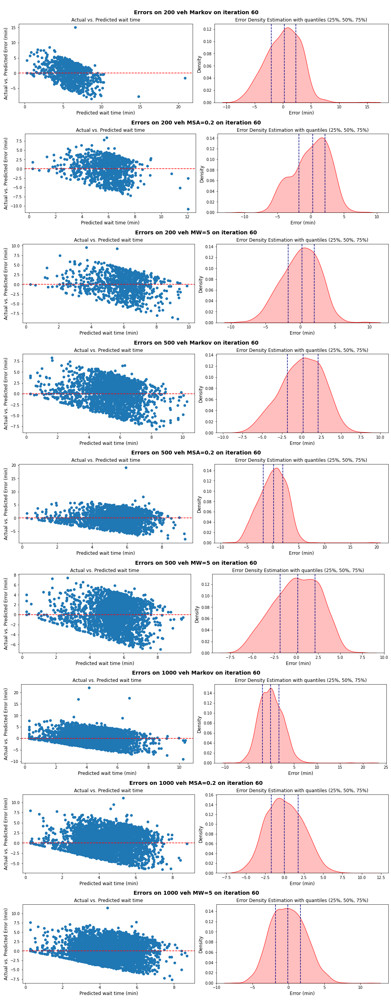

In [42]:
waitTime_pred_stats = predictions_evaluations.plot_multiple_actual_vs_fitted(data_list, 'waitTime')

In [43]:
navy_hex = matplotlib.colors.to_hex('navy')
red_hex = matplotlib.colors.to_hex('darkred')
c_gradient = utils.get_color_gradient(red_hex, navy_hex, 3)

plot_list_color_200 = [
    ('200 veh Markov', data_200['markov'], c_gradient[0], '-'),
    ('200 veh MSA=0.2', data_200['msa02'], c_gradient[1], '--'),
    ('200 veh MW=5', data_200['mw5'], c_gradient[2], ':')
]
plot_list_color_500 = [
    ('500 veh Markov', data_500['markov'], c_gradient[0], '-'),
    ('500 veh MSA=0.2', data_500['msa02'], c_gradient[1], '--'),
    ('500 veh MW=5', data_500['mw5'], c_gradient[2], ':')
]
plot_list_color_1000 = [
    ('1000 veh Markov', data_1000['markov'], c_gradient[0], '-'),
    ('1000 veh MSA=0.2', data_1000['msa02'], c_gradient[1], '--'),
    ('1000 veh MW=5', data_1000['mw5'], c_gradient[2], ':')
]

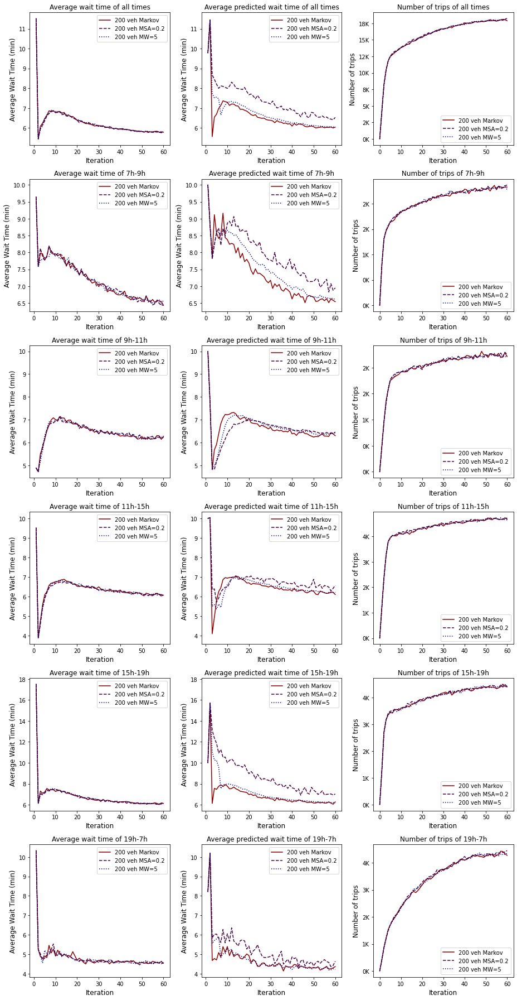

In [44]:
predictions_evaluations.plot_iteration_avg_wait_time(plot_list_color_200)

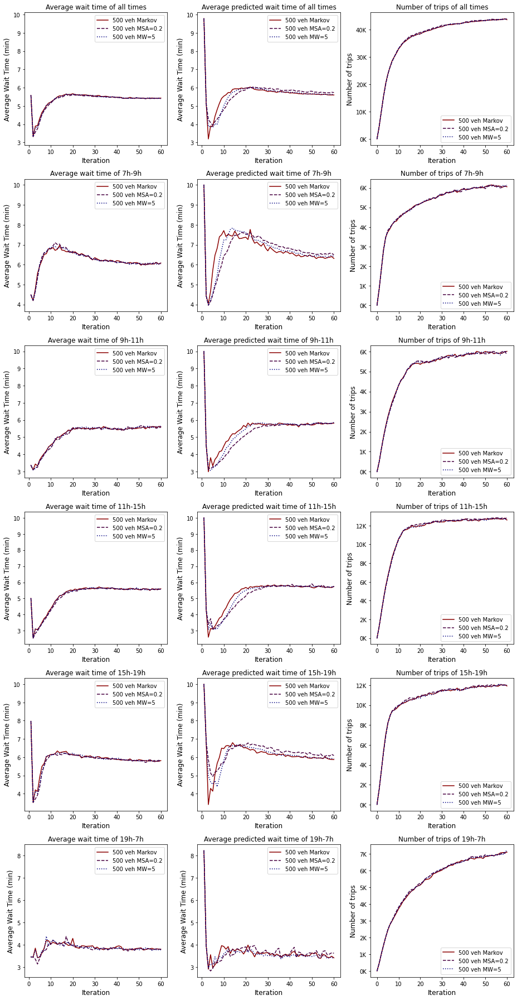

In [45]:
predictions_evaluations.plot_iteration_avg_wait_time(plot_list_color_500)

In [ ]:
predictions_evaluations.plot_iteration_avg_wait_time(plot_list_color_1000)

In [ ]:
data_markov = euler_utils.read_output(
    os.path.join(scratch_folder,"idf","fleetSize_1000","markov"),
    last_iter=last_iter
)

In [ ]:
data_msa02 = euler_utils.read_output(
    os.path.join(scratch_folder,"idf","fleetSize_1000","msa02"),
    last_iter=last_iter
)

In [ ]:
data_mw5 = euler_utils.read_output(
    os.path.join(scratch_folder,"idf","fleetSize_1000","mw5"),
    last_iter=last_iter
)

In [ ]:
plot_list = [
    ('Markov', data_markov, last_iter),
    ('MSA=0.2', data_msa02, last_iter),
    ('MW=5',data_mw5, last_iter)
]

In [ ]:
display(plotting_utils.get_multiple_stats_table(plot_list))


In [ ]:
waitTime_pred_stats = predictions_evaluations.plot_multiple_actual_vs_fitted(plot_list, 'waitTime')

In [ ]:
navy_hex = matplotlib.colors.to_hex('navy')
red_hex = matplotlib.colors.to_hex('darkred')
c_gradient = utils.get_color_gradient(red_hex, navy_hex, 3)

plot_list_color = [
    ('Markov', data_markov, c_gradient[0], '-'),
    ('MSA = 0.2', data_msa02, c_gradient[1], '--'),
    ('MW = 5', data_mw5, c_gradient[2], ':'),
]

In [ ]:
predictions_evaluations.plot_iteration_avg_wait_time(plot_list_color)

In [ ]:
predictions_evaluations.plot_iteration_avg_travel_time(plot_list_color)

In [30]:
cells = data_markov['fixedZones'].copy(deep=True)

In [31]:
cells.crs = "EPSG:2154"

In [32]:
cells.explore()

In [36]:
cells

,zoneId,centerX,centerY,geometry
0,1,625280.229522,6.830189e+06,"POLYGON ((623280.230 6830188.823, 624280.230 6..."
1,10,649280.229522,6.833653e+06,"POLYGON ((647280.230 6833652.925, 648280.230 6..."
2,11,625280.229522,6.837117e+06,"POLYGON ((623280.230 6837117.027, 624280.230 6..."
3,12,631280.229522,6.837117e+06,"POLYGON ((629280.230 6837117.027, 630280.230 6..."
4,13,637280.229522,6.837117e+06,"POLYGON ((635280.230 6837117.027, 636280.230 6..."
...,...,...,...,...
65,69,646280.229522,6.852705e+06,"POLYGON ((644280.230 6852705.484, 645280.230 6..."
66,7,631280.229522,6.833653e+06,"POLYGON ((629280.230 6833652.925, 630280.230 6..."
67,70,652280.229522,6.852705e+06,"POLYGON ((650280.230 6852705.484, 651280.230 6..."
68,8,637280.229522,6.833653e+06,"POLYGON ((635280.230 6833652.925, 636280.230 6..."


In [34]:
import geopandas as gpd

In [39]:
cells_2 = gpd.read_file(os.path.join(scratch_folder,"idf","fleetSize_1000","markov",'drt_waitStats_drt_zonal.shp'))

In [40]:
cells_2.crs = "EPSG:2154"

In [41]:
cells_2.explore()

In [42]:
import matsim

In [49]:
network = matsim.read_network('/cluster/scratch/mfrancesc/IVT/SA_scenario/idf/fleetSize_1000/markov/output_network.xml.gz')

In [53]:
network.nodes

""


In [45]:
geo = network.as_geo()
geo.plot()

KeyError: 'node_id'

### This was to check that the dynamic CN worked correctly

In [107]:
data_dynamic_CN_markov[10]['drt_trips_stats'][1]

,personId,tripIndex,startTime,arrivalTime,totalTravelTime,routerUnsharedTime,estimatedUnsharedTime,delayFactor,waitTime,startX,startY,endX,endY,euclideanDistance
0,5304327,0,39175.0,39459.0,247.0,182.000,212.64475,1.357143,37.0,646631.886686,6.838136e+06,646344.727525,6.838477e+06,446.092706
1,5403970,2,47339.0,48935.0,1566.0,750.472,660.77085,2.086687,30.0,645716.987582,6.848282e+06,648153.898386,6.843953e+06,4967.992861
2,5445627,6,58901.0,59698.0,299.0,282.468,218.34565,1.058527,498.0,645287.193632,6.847532e+06,645397.016612,6.848463e+06,938.141136
3,5403149,1,61373.0,62938.0,1549.0,1270.305,790.47250,1.219392,16.0,642424.741225,6.846568e+06,649014.167445,6.842902e+06,7540.527726
4,5810972,2,46325.0,46669.0,208.0,194.343,156.76010,1.070273,136.0,641641.072346,6.844351e+06,642619.322901,6.844611e+06,1012.139406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4537,5521973,2,56683.0,57722.0,1007.0,556.782,456.25210,1.808607,32.0,645912.190571,6.841620e+06,647553.962065,6.844001e+06,2892.318749
4538,5778616,1,60285.0,60714.0,413.0,382.167,325.88105,1.080679,16.0,638763.373081,6.842640e+06,639867.274261,6.842427e+06,1124.191264
4539,5541379,5,59907.0,60804.0,423.0,413.206,292.31090,1.023702,474.0,645118.180305,6.845764e+06,644086.853319,6.843790e+06,2227.349894
4540,5811055,1,52152.0,52337.0,169.0,144.563,140.33370,1.169040,16.0,644309.188067,6.838175e+06,644722.274801,6.838113e+06,417.676204


In [112]:
data_dynamic_CN_markov[10]['drt_trips_stats'][1].shape

(4542, 14)

In [111]:
data_dynamic_CN_markov[10]['drt_predictions'][1].merge(data_dynamic_CN_markov[10]['drt_trips_stats'][1], on=['personId','tripIndex'])

,personId,tripIndex,startLink,startTime_x,travelTime_min,accessEgressTime_min,cost_MU,waitingTime_min,euclideanDistance_km,maxTravelTime_min,directRideTime_min,startTime_y,arrivalTime,totalTravelTime,routerUnsharedTime,estimatedUnsharedTime,delayFactor,waitTime,startX,startY,endX,endY,euclideanDistance
0,11629817,0,691959.0,67198.0,10.073952,2.883333,0.320949,10.0,0.460428,10.073952,3.382635,67197.0,67771.0,238.0,231.000,202.95810,1.030303,336.0,635353.481935,6.847918e+06,635667.089727,6.847650e+06,412.493497
1,11630024,1,36759.0,44904.0,6.322990,6.200000,0.104986,10.0,0.408744,6.322990,0.881993,44903.0,45088.0,56.0,37.000,52.91960,1.513514,129.0,635495.937792,6.847234e+06,635265.929976,6.846995e+06,331.666582
2,11636874,0,447570.0,46356.0,9.888444,3.700000,0.503192,10.0,0.716840,9.888444,3.258963,46355.0,46810.0,285.0,263.034,195.53775,1.083510,170.0,636590.686710,6.845045e+06,636056.553667,6.844489e+06,771.388282
3,11629027,0,691963.0,47367.0,15.409520,1.450000,0.914578,10.0,0.797968,15.409520,6.939680,47366.0,47933.0,465.0,417.442,416.38080,1.113927,102.0,635631.504075,6.847640e+06,635902.136902,6.846902e+06,786.380379
4,11637560,0,10461.0,29238.0,9.977791,1.966667,0.421081,10.0,0.562577,9.977791,3.318528,29237.0,29756.0,260.0,232.187,199.11165,1.119787,259.0,637012.527204,6.844862e+06,636458.151986,6.844670e+06,586.692541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4537,5807952,1,344557.0,42462.0,11.829169,3.866667,0.494309,10.0,0.458403,11.829169,4.552779,42461.0,42810.0,333.0,319.579,273.16675,1.041996,16.0,639283.607634,6.843175e+06,639437.973384,6.843581e+06,434.577100
4538,5807952,2,689591.0,47896.0,11.689664,3.866667,0.447887,10.0,0.458403,11.689664,4.459776,47895.0,70237.0,319.0,279.730,267.58655,1.140385,22023.0,639437.973384,6.843581e+06,639283.607634,6.843175e+06,434.577100
4539,5807952,3,344557.0,59262.0,11.828565,3.866667,0.494309,10.0,0.458403,11.828565,4.552377,70435.0,70925.0,338.0,317.789,273.14260,1.063599,152.0,639283.607634,6.843175e+06,639437.973384,6.843581e+06,434.577100
4540,5811370,0,339187.0,36197.0,19.021594,2.683333,1.750364,10.0,3.101142,19.021594,9.347729,36196.0,37045.0,700.0,671.873,560.86375,1.041864,149.0,644593.173680,6.845054e+06,646606.639347,6.847457e+06,3134.950046


In [118]:
merged_it_2 = data_dynamic_CN_markov[10]['drt_predictions'][2].merge(data_dynamic_CN_markov[10]['drt_trips_stats'][2], on=['personId','tripIndex']).copy(deep=True)

In [140]:
merged_it_2.iloc[1].waitingTime_min

1.91

In [141]:
merged_it_2.iloc[1].startTime_x/1800

35.52055555555555

In [142]:
s_x = merged_it_2.iloc[1].startX

In [143]:
s_y = merged_it_2.iloc[1].startY

In [144]:
trips_it_1 = data_dynamic_CN_markov[10]['drt_trips_stats'][1].copy(deep=True)

In [145]:
trips_it_1['dist_to_point'] = np.sqrt((trips_it_1.startX-s_x)**2 + (trips_it_1.startY-s_y)**2)

In [149]:
trips_it_1_selected = trips_it_1[(trips_it_1.startTime >= 35*1800) & (trips_it_1.startTime < 36*1800)]

In [150]:
trips_it_1_selected.sort_values('dist_to_point').head(10).waitTime.mean()/60

1.91